In [1]:
from keras.applications import InceptionV3
import os
import numpy as np
import cv2
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.imagenet_utils import decode_predictions
import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.



## Model Download

In [2]:
import tensorflow as tf
from keras import backend as K

config = tf.ConfigProto()
config.gpu_options.allow_growth=True
sess = tf.Session(config=config)
K.set_session(sess)


In [3]:
image_size = 224
resnet_conv = InceptionV3(weights='imagenet', include_top=False, input_shape=(image_size, image_size,3))

In [4]:
for layer in resnet_conv.layers[:-4]:     
    layer.trainable = False
for layer in resnet_conv.layers:
    print(layer, layer.trainable)

(<keras.engine.input_layer.InputLayer object at 0x7fd62b4fbad0>, False)
(<keras.layers.convolutional.Conv2D object at 0x7fd62b4fbed0>, False)
(<keras.layers.normalization.BatchNormalization object at 0x7fd62b4fbe50>, False)
(<keras.layers.core.Activation object at 0x7fd6bc1f4990>, False)
(<keras.layers.convolutional.Conv2D object at 0x7fd62b4e6fd0>, False)
(<keras.layers.normalization.BatchNormalization object at 0x7fd62b5153d0>, False)
(<keras.layers.core.Activation object at 0x7fd62b496410>, False)
(<keras.layers.convolutional.Conv2D object at 0x7fd62b42d650>, False)
(<keras.layers.normalization.BatchNormalization object at 0x7fd6281a5f50>, False)
(<keras.layers.core.Activation object at 0x7fd62812cad0>, False)
(<keras.layers.pooling.MaxPooling2D object at 0x7fd628101d10>, False)
(<keras.layers.convolutional.Conv2D object at 0x7fd6280c6390>, False)
(<keras.layers.normalization.BatchNormalization object at 0x7fd62811ce50>, False)
(<keras.layers.core.Activation object at 0x7fd62806f6d0

## Creating a new Model


In [5]:
from keras import models
from keras import layers
from keras import optimizers
from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=1, mode='auto')


# Create the model
model = models.Sequential()
 
# Add the vgg convolutional base model
model.add(resnet_conv)
 
# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.75))
model.add(layers.Dense(2, activation='softmax'))
 
# Show a summary of the model. Check the number of trainable parameters
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 5, 5, 2048)        21802784  
_________________________________________________________________
flatten_1 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              52429824  
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 2050      
Total params: 74,234,658
Trainable params: 52,431,874
Non-trainable params: 21,802,784
_________________________________________________________________


## Setup data generators

In [6]:
from keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')
 
validation_datagen = ImageDataGenerator(rescale=1./255)
 
# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 10
 
train_generator = train_datagen.flow_from_directory(
        '../../data/deep_learn/train/',
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')
 
validation_generator = validation_datagen.flow_from_directory(
        '../../data/deep_learn/train/',
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=True)

Found 1500 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.


In [7]:
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              #optimizer='sgd',
              metrics=['acc'])



In [8]:
# Train the model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,verbose=1)


Epoch 1/20
30/30 [==============================] - 67s 2s/step - loss: 4.1899 - acc: 0.5893 - val_loss: 2.2969 - val_acc: 0.6473
Epoch 2/20
30/30 [==============================] - 57s 2s/step - loss: 1.7790 - acc: 0.6900 - val_loss: 6.9043 - val_acc: 0.5013
Epoch 3/20
30/30 [==============================] - 57s 2s/step - loss: 0.9310 - acc: 0.7940 - val_loss: 1.2865 - val_acc: 0.6933
Epoch 4/20
30/30 [==============================] - 57s 2s/step - loss: 0.7550 - acc: 0.7833 - val_loss: 2.6228 - val_acc: 0.5540
Epoch 5/20
30/30 [==============================] - 57s 2s/step - loss: 0.5856 - acc: 0.7947 - val_loss: 0.4692 - val_acc: 0.8293
Epoch 6/20
30/30 [==============================] - 57s 2s/step - loss: 0.4701 - acc: 0.8313 - val_loss: 0.4594 - val_acc: 0.8533
Epoch 7/20
30/30 [==============================] - 57s 2s/step - loss: 0.4963 - acc: 0.8387 - val_loss: 2.5592 - val_acc: 0.5647
Epoch 8/20
30/30 [==============================] - 58s 2s/step - loss: 0.3957 - acc: 0.86

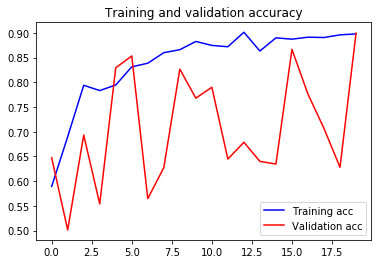

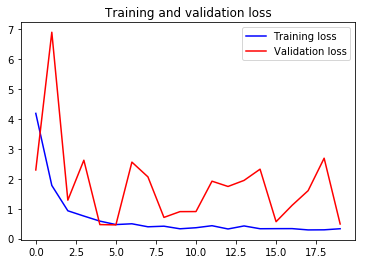

In [9]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [10]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        '/home/nagai/Documents/Projects/Estomatos_PI/Imagens/data_final/deep_learn/train/',
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)


Found 1500 images belonging to 2 classes.


150/150 [==============================] - 31s 208ms/step
No of errors = 151/1500


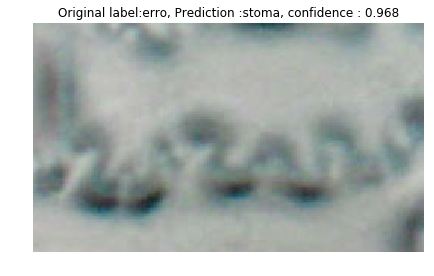

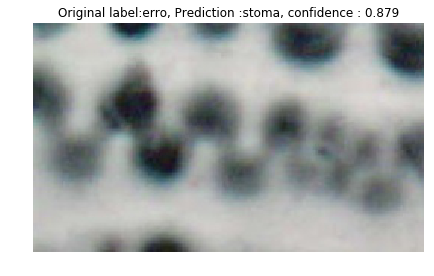

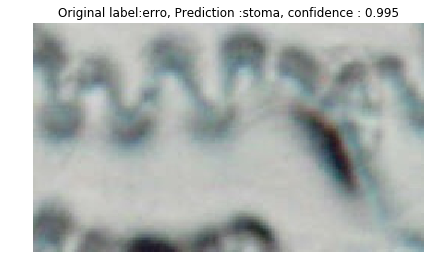

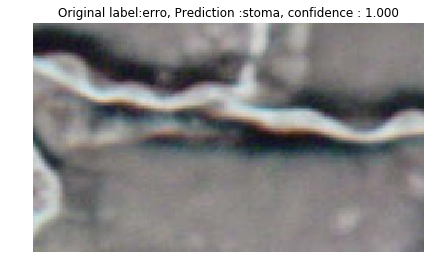

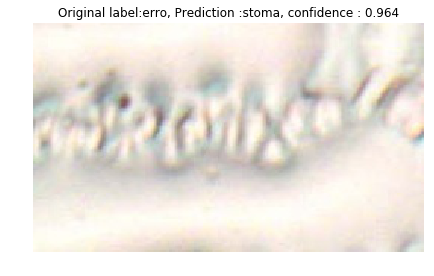

...

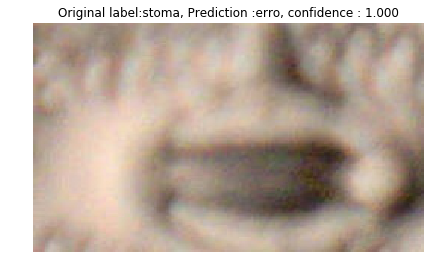

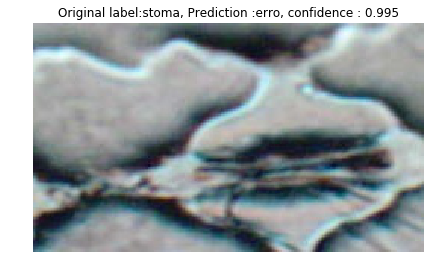

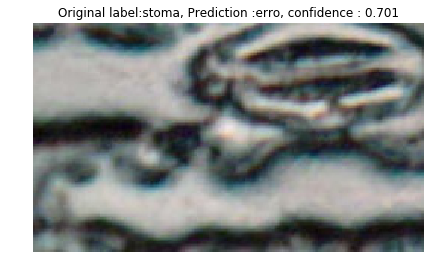

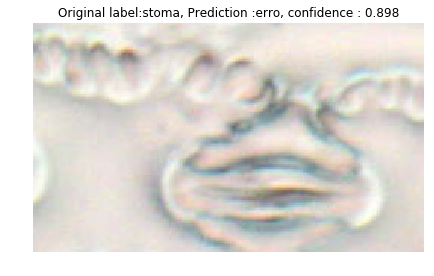

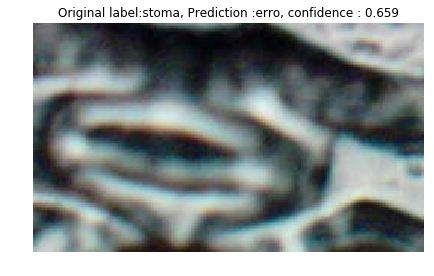

In [11]:
 
# Get the filenames from the generator
fnames = validation_generator.filenames
 
# Get the ground truth from generator
ground_truth = validation_generator.classes
 
# Get the label to class mapping from the generator
label2index = validation_generator.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())
 
# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)
 
errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))
 
# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
     
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
     
    original = load_img('{}/{}'.format('../../data/deep_learn/train/',fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

In [13]:
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=1, mode='auto')


# Create the model
model = models.Sequential()
 
# Add the vgg convolutional base model
model.add(resnet_conv)
 
# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.75))
model.add(layers.Dense(2, activation='softmax'))
 
# Show a summary of the model. Check the number of trainable parameters
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 5, 5, 2048)        21802784  
_________________________________________________________________
flatten_2 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 1024)              52429824  
_________________________________________________________________
dropout_2 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 2050      
Total params: 74,234,658
Trainable params: 52,431,874
Non-trainable params: 21,802,784
_________________________________________________________________


In [14]:
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              #optimizer='sgd',
              metrics=['acc'])

In [15]:
# Train the model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=6,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,verbose=1)


Epoch 1/6
30/30 [==============================] - 63s 2s/step - loss: 6.7591 - acc: 0.5247 - val_loss: 7.0255 - val_acc: 0.5007
Epoch 2/6
30/30 [==============================] - 58s 2s/step - loss: 2.0222 - acc: 0.6673 - val_loss: 1.1094 - val_acc: 0.7273
Epoch 3/6
30/30 [==============================] - 58s 2s/step - loss: 0.9674 - acc: 0.7580 - val_loss: 1.1842 - val_acc: 0.6680
Epoch 4/6
30/30 [==============================] - 58s 2s/step - loss: 0.5840 - acc: 0.7887 - val_loss: 0.3411 - val_acc: 0.8740
Epoch 5/6
30/30 [==============================] - 58s 2s/step - loss: 0.6361 - acc: 0.7727 - val_loss: 1.6416 - val_acc: 0.5893
Epoch 6/6
30/30 [==============================] - 58s 2s/step - loss: 0.4411 - acc: 0.8380 - val_loss: 1.2496 - val_acc: 0.6593


In [16]:
model.summary()
model.pop()
model.pop()
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 5, 5, 2048)        21802784  
_________________________________________________________________
flatten_2 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 1024)              52429824  
_________________________________________________________________
dropout_2 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 2050      
Total params: 74,234,658
Trainable params: 52,431,874
Non-trainable params: 21,802,784
_________________________________________________________________
_________________________________________________________________
Layer (type)                 Output Shape              

/usr/local/lib/python2.7/dist-packages/keras/engine/training.py:478: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


In [17]:
model.save('estomato_InceptionV3.h5')